In [1]:
import os

from astropy.io import fits
from matplotlib import pyplot as plt
import numpy as np
from IPython.display import Image

from exotedrf import utils, stage1, stage2

os.chdir(f"{os.environ['HOME']}/Code/ExoTiC-NEAT-training/")
os.environ['CRDS_PATH'] = './crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

In [2]:
def plot_spectrum(path, vmin=1e4, vmax=3e4):
    with fits.open(path) as file:
        plt.figure(figsize=(8, 3))
        plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
                   vmin=vmin, vmax=vmax)
        plt.show()
    return path

In [3]:
# Generate output directories
utils.verify_path('/data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1')
utils.verify_path('/data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage2')

In [4]:
# First define some input and output directory paths.

uncal_indir = '/data/praxis2/shared_area/jwst/w39/soss/1366_01/stage0/'  # Where our uncalibrated files are found.
outdir_s1 = '/data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/'  # Where to save our Stage 1 output files.

In [5]:
observation_id = "jw01366001001"

In [6]:
filenames = [
    f"{uncal_indir}{observation_id}_04101_00001-seg001_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg002_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg003_nis_uncal.fits",
    f"{uncal_indir}{observation_id}_04101_00001-seg004_nis_uncal.fits",
]


In [7]:
with fits.open(filenames[0]) as file:
    print('No. integrations: {}'.format(file[0].header['NINTS']))
    print('No. groups: {}'.format(file[0].header['NGROUPS']))
    print('subarray: {}'.format(file[0].header['SUBARRAY']))



No. integrations: 537
No. groups: 9
subarray: SUBSTRIP256


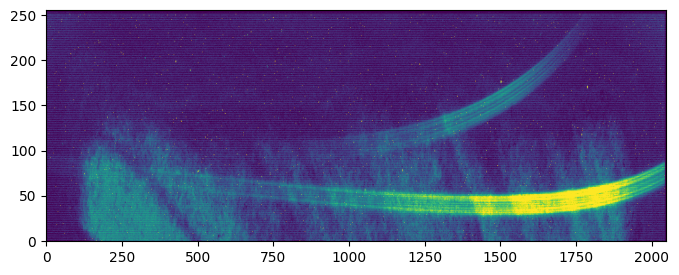

'/data/praxis2/shared_area/jwst/w39/soss/1366_01/stage0/jw01366001001_04101_00001-seg001_nis_uncal.fits'

In [8]:
plot_spectrum(filenames[0])

In [9]:
step = stage1.DQInitStep(filenames, deepframe=None, output_dir=outdir_s1)

# Now run the step!

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:09:48,369 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 10:09:49,211 - CRDS - INFO -  Calibration SW Found: jwst 1.12.5 (/home/bi19158/Code/soss-data-reduction/venv/lib/python3.10/site-packages/jwst-1.12.5.dist-info)
2025-08-20 10:09:50,910 - stpipe.DQInitStep - INFO - DQInitStep instance created.
2025-08-20 10:09:51,069 - stpipe.DQInitStep - INFO - Step DQInitStep running with args (<Level1bModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_uncal.fits>,).
2025-08-20 10:09:51,071 - stpipe.DQInitStep - INFO - Step DQInitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:09:51,521 - stpipe.DQInitStep - INFO - Using MASK reference file ./crds_cache/reference

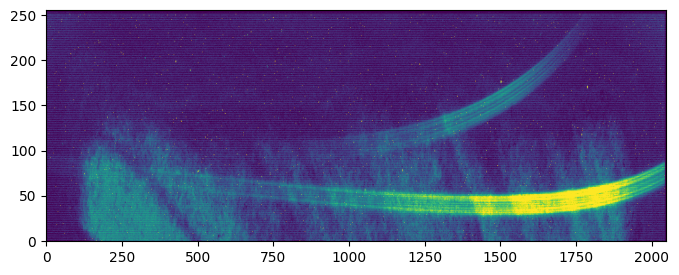

In [10]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_dqinitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [11]:

step = stage1.SaturationStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:10:24,343 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 10:10:24,363 - stpipe.SaturationStep - INFO - SaturationStep instance created.
2025-08-20 10:10:24,518 - stpipe.SaturationStep - INFO - Step SaturationStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_dqinitstep.fits>,).
2025-08-20 10:10:24,520 - stpipe.SaturationStep - INFO - Step SaturationStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  n_pix_grow_sat: 1
2025-08-20 10:10:24,557 - stpipe.SaturationStep - INFO - Using SATURATION reference file ./crds_cache/references/jwst/niriss/jwst_niriss_saturation_0015.fits
2025-08-20 10:10:24,631 - stpipe.SaturationStep - WARNING - K

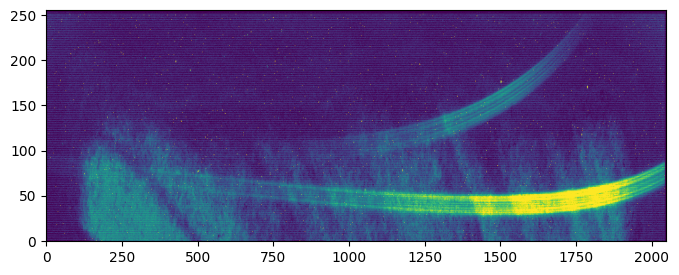

In [12]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_saturationstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e4, vmax=3e4)
    plt.show()

In [13]:
saturation_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_saturationstep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_saturationstep.fits",
]

step = stage1.SuperBiasStep(saturation_step_files, output_dir=outdir_s1)

# This step has options for diagnostic plotting. Specifying do_plot=True will create the step
# plot and save it to the output directory.

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 10:12:06,675 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 10:12:06,695 - stpipe.SuperBiasStep - INFO - SuperBiasStep instance created.
2025-08-20 10:12:06,854 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_saturationstep.fits>,).
2025-08-20 10:12:06,857 - stpipe.SuperBiasStep - INFO - Step SuperBiasStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:12:06,894 - stpipe.SuperBiasStep - INFO - Using SUPERBIAS reference file ./crds_cache/references/jwst/niriss/jwst_niriss_superbias_0181.fits
2025-08-20 10:12:08,544 - stpipe.SuperBiasStep - INFO - Results used CRDS context: jwst_

2025-08-20 10:12:43.611 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 10:12:49.039 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/superbiasstep.png


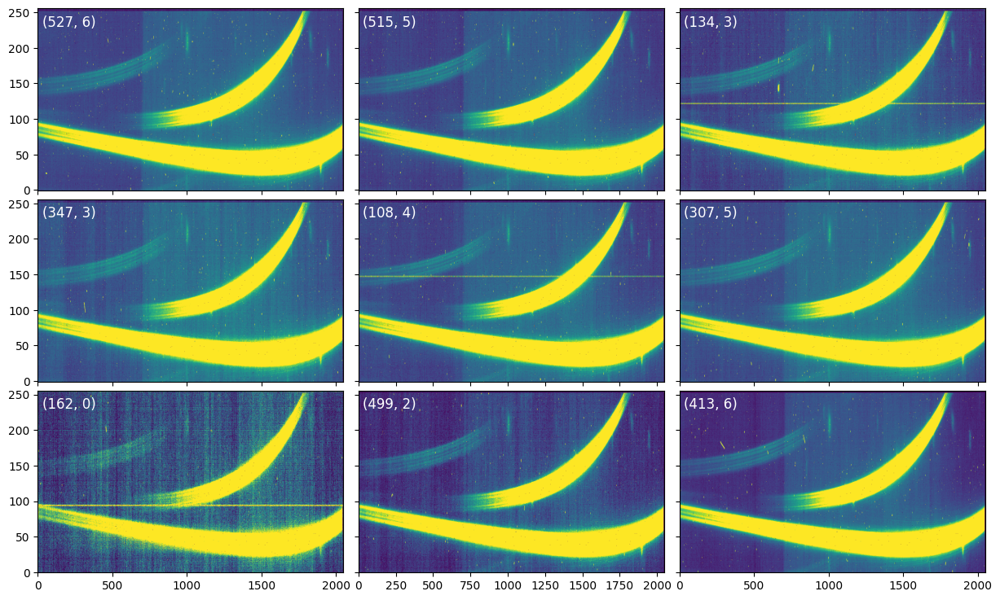

In [14]:
Image(filename=outdir_s1 + 'superbiasstep_1.png')

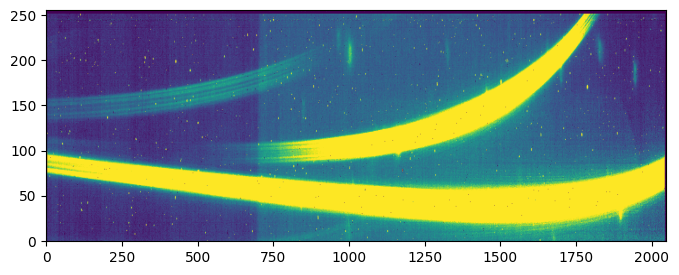

In [15]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_superbiasstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [16]:
step = stage1.RefPixStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:12:49,445 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 10:12:49,465 - stpipe.RefPixStep - INFO - RefPixStep instance created.
2025-08-20 10:12:49,635 - stpipe.RefPixStep - INFO - Step RefPixStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_superbiasstep.fits>,).
2025-08-20 10:12:49,638 - stpipe.RefPixStep - INFO - Step RefPixStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  odd_even_columns: True
  use_side_ref_pixels: True
  side_smoothing_length: 11
  side_gain: 1.0
  odd_even_rows: True
  ovr_corr_mitigation_ftr: 3.0
2025-08-20 10:12:50,562 - stpipe.RefPixStep - INFO - NIR subarray data
2025-08-20 10:12:50,566 - stpipe.RefPixStep - 

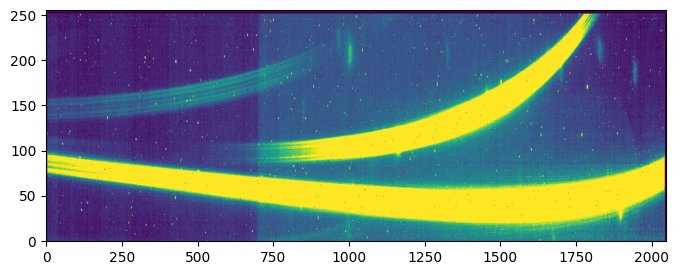

In [17]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_refpixstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    # Let's check out the last group of the 10th integration
    plt.imshow(file[1].data[10, -1], aspect='auto', origin='lower',
               vmin=1e2, vmax=9e2)
    plt.show()

In [18]:
step = stage1.DarkCurrentStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 10:13:45,214 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 10:13:45,235 - stpipe.DarkCurrentStep - INFO - DarkCurrentStep instance created.
2025-08-20 10:13:45,393 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_refpixstep.fits>,).
2025-08-20 10:13:45,396 - stpipe.DarkCurrentStep - INFO - Step DarkCurrentStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  dark_output: None
2025-08-20 10:13:45,433 - stpipe.DarkCurrentStep - INFO - Using DARK reference file ./crds_cache/references/jwst/niriss/jwst_niriss_dark_0171.fits
2025-08-20 10:13:45,555 - stpipe.DarkCurrentStep - INFO - Scienc

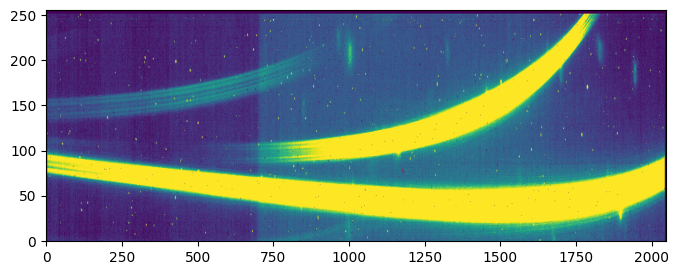

'/data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/jw01366001001_04101_00001-seg001_nis_darkcurrentstep.fits'

In [19]:
plot_spectrum(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg001_nis_darkcurrentstep.fits"), vmin=1e2, vmax=9e2)

In [20]:
background_model = np.load("model_background256.npy")

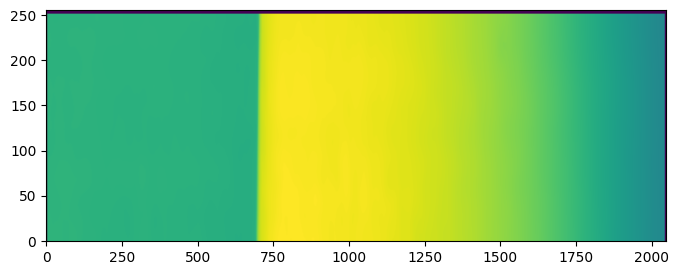

In [21]:
plt.figure(figsize=(8, 3))
plt.imshow(background_model, aspect='auto', origin='lower')
plt.show()

In [22]:
step = stage2.BackgroundStep(results, background_model=background_model,
                             baseline_ints=[150, -100], output_dir=outdir_s1)

results, bkg = step.run(save_results=True, differential=True, force_redo=True, do_plot=True)


2025-08-20 10:14:26.683 - exoTEDRF - INFO - BackgroundStep instance created.
2025-08-20 10:14:31.404 - exoTEDRF - INFO - Starting background subtraction step.
2025-08-20 10:14:34.677 - exoTEDRF - INFO - Generating a median stack using baseline integrations.
2025-08-20 10:16:37.132 - exoTEDRF - INFO - Calculating background model scaling.
2025-08-20 10:16:37.136 - exoTEDRF - INFO - Using differential background scale factors: 0.00282, 1.42048, and shift: 7.90751
2025-08-20 10:16:37.144 - exoTEDRF - INFO - Using differential background scale factors: 3.42907, 5.44140, and shift: 0.00000
2025-08-20 10:16:37.151 - exoTEDRF - INFO - Using differential background scale factors: 8.35403, 10.51142, and shift: 0.00000
2025-08-20 10:16:37.157 - exoTEDRF - INFO - Using differential background scale factors: 13.51085, 15.19501, and shift: 0.00000
2025-08-20 10:16:37.163 - exoTEDRF - INFO - Using differential background scale factors: 18.54762, 20.11869, and shift: 0.00000
2025-08-20 10:16:37.169 -

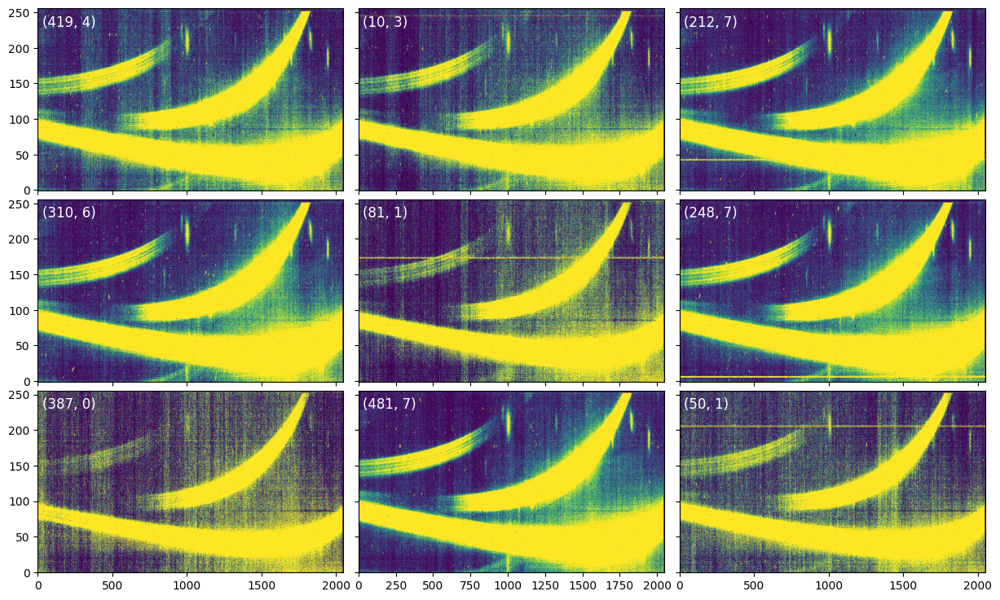

In [23]:
Image(filename=outdir_s1 + 'backgroundstep_1.png')

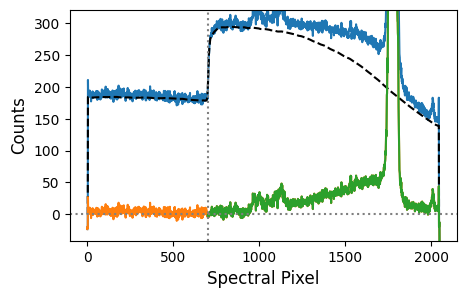

In [24]:
Image(filename=outdir_s1 + 'backgroundstep_2.png')

In [25]:
pixel_masks = None
timeseries = None
step = stage1.OneOverFStep(results, baseline_ints=[150, -100], output_dir=outdir_s1,
                           pixel_masks=pixel_masks, soss_timeseries=timeseries,
                           method='scale-achromatic', soss_background=bkg)
results = step.run(save_results=True, even_odd_rows=True, force_redo=True, do_plot=True,
                   soss_inner_mask_width=40)

2025-08-20 10:17:33.528 - exoTEDRF - INFO - OneOverFStep instance created.
2025-08-20 10:17:38.872 - exoTEDRF - INFO - Starting 1/f correction step using the scale-achromatic method.
2025-08-20 10:17:42.160 - exoTEDRF - INFO - Generating a deep stack for each group using baseline integrations.


2025-08-20 10:19:44,519 - stpipe.Extract1dStep - INFO - Extract1dStep instance created.


2025-08-20 10:19:44.516 - exoTEDRF - INFO - No centroids provided, locating trace positions.
2025-08-20 10:19:45.117 - exoTEDRF - WARNING - No outlier maps passed, ignoring outliers.
2025-08-20 10:19:45.398 - exoTEDRF - INFO - Constructing trace mask.
2025-08-20 10:19:45.699 - exoTEDRF - INFO - Flagging additional outliers.
2025-08-20 10:23:13.651 - exoTEDRF - WARNING - No timeseries passed. It will be estimated from current data.
2025-08-20 10:23:14.976 - exoTEDRF - INFO - Starting full frame correction.


100%|██████████| 537/537 [00:42<00:00, 12.56it/s]


2025-08-20 10:24:30.193 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 10:26:42.449 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/oneoverfstep_1.png
2025-08-20 10:26:42.469 - exoTEDRF - INFO - Doing diagnostic plot 2.


100%|██████████| 25/25 [01:57<00:00,  4.69s/it]


2025-08-20 10:33:55.113 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/oneoverfstep_2.png
2025-08-20 10:33:55.113 - exoTEDRF - INFO - Step OneOverFStep done.


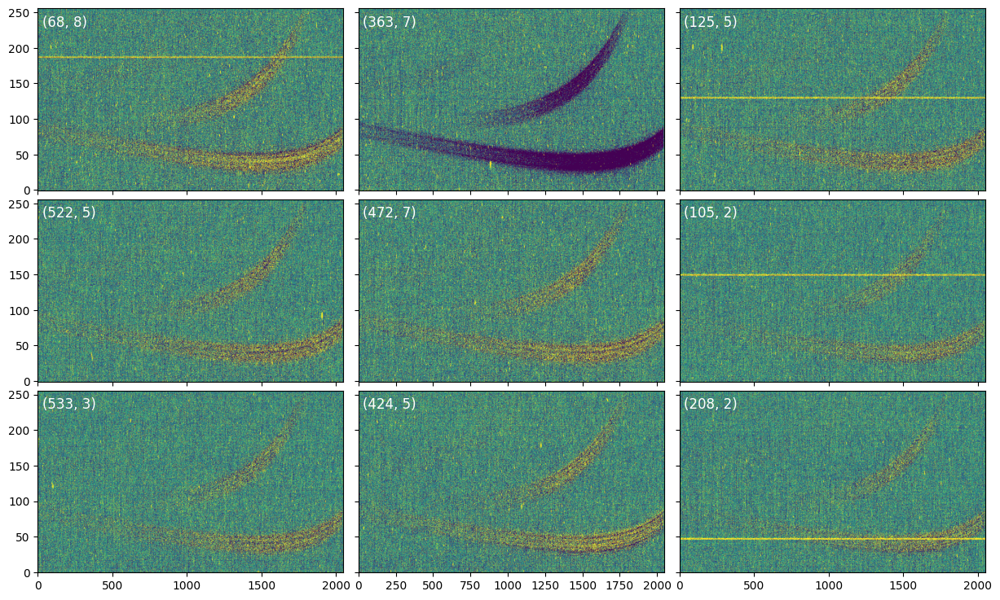

In [26]:
Image(filename=outdir_s1 + 'oneoverfstep_1.png')



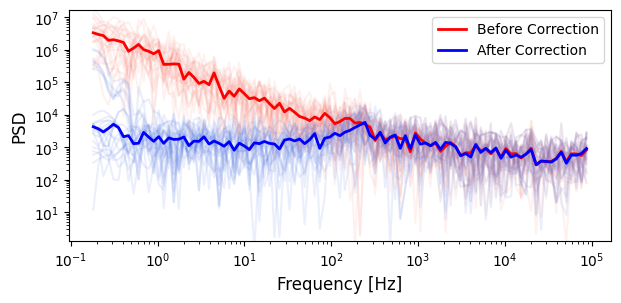

In [27]:
Image(filename=outdir_s1 + 'oneoverfstep_2.png')


In [28]:
step = stage1.LinearityStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True, do_plot=True)

2025-08-20 10:33:55,214 - stpipe.LinearityStep - INFO - LinearityStep instance created.
2025-08-20 10:33:55,234 - stpipe.LinearityStep - INFO - LinearityStep instance created.


2025-08-20 10:33:55,529 - stpipe.LinearityStep - INFO - Step LinearityStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_oneoverfstep.fits>,).
2025-08-20 10:33:55,531 - stpipe.LinearityStep - INFO - Step LinearityStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 10:33:55,567 - stpipe.LinearityStep - INFO - Using Linearity reference file ./crds_cache/references/jwst/niriss/jwst_niriss_linearity_0017.fits
2025-08-20 10:33:55,672 - stpipe.LinearityStep - WARNING - Keyword LOWILLUM does not correspond to an existing DQ mnemonic, so will be ignored
2025-08-20 10:33:55,673 - stpipe.LinearityStep - WARNING - Keyword LOWRESP does not correspond to an existing DQ mnemonic, 

2025-08-20 10:37:46.144 - exoTEDRF - INFO - Doing diagnostic plot 1.
2025-08-20 10:37:54.911 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/linearitystep_1.png
2025-08-20 10:37:54.955 - exoTEDRF - INFO - Doing diagnostic plot 2.
2025-08-20 10:38:32.407 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/linearitystep_2.png


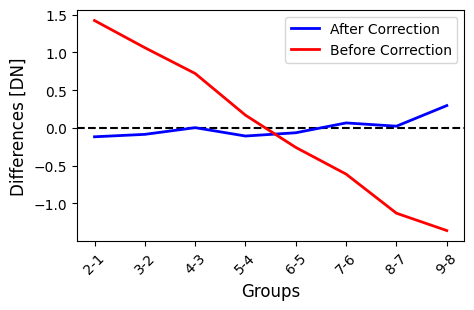

In [29]:
Image(filename=outdir_s1 + 'linearitystep_1.png')



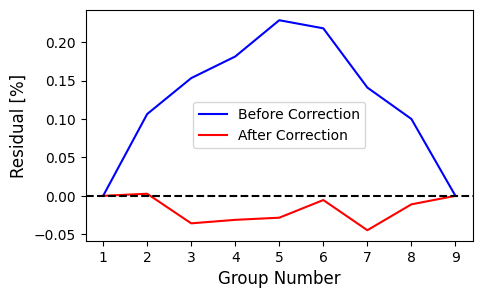

In [30]:
Image(filename=outdir_s1 + 'linearitystep_2.png')



In [31]:
linearity_step_files = [
    f"{outdir_s1}{observation_id}_04101_00001-seg001_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg002_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg003_nis_linearitystep.fits",
    f"{outdir_s1}{observation_id}_04101_00001-seg004_nis_linearitystep.fits",
]

step = stage1.JumpStep(linearity_step_files, output_dir=outdir_s1)
results = step.run(save_results=True, force_redo=True, flag_in_time=True,
                   time_rejection_threshold=7, do_plot=True)

2025-08-20 10:38:40.102 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 9/9 [24:08<00:00, 160.93s/it]


2025-08-20 11:02:48.600 - exoTEDRF - INFO - 1090229 jumps flagged
2025-08-20 11:02:48.600 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:02:54.737 - exoTEDRF - INFO - Done
2025-08-20 11:02:54.760 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 9/9 [23:17<00:00, 155.29s/it]


2025-08-20 11:26:12.477 - exoTEDRF - INFO - 1123579 jumps flagged
2025-08-20 11:26:12.477 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:26:18.659 - exoTEDRF - INFO - Done
2025-08-20 11:26:18.682 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 9/9 [22:30<00:00, 150.01s/it]


2025-08-20 11:48:48.900 - exoTEDRF - INFO - 1096735 jumps flagged
2025-08-20 11:48:48.900 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:48:55.353 - exoTEDRF - INFO - Done
2025-08-20 11:48:55.376 - exoTEDRF - INFO - Starting time-domain jump detection step.


100%|██████████| 9/9 [08:32<00:00, 56.91s/it]


2025-08-20 11:57:27.611 - exoTEDRF - INFO - 437942 jumps flagged
2025-08-20 11:57:27.611 - exoTEDRF - INFO - and 0 interpolated
2025-08-20 11:57:30.295 - exoTEDRF - INFO - Done
2025-08-20 11:57:30.299 - exoTEDRF - INFO - Doing diagnostic plot.
2025-08-20 11:58:42.004 - exoTEDRF - INFO - Plot saved to /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/jump.png
2025-08-20 11:58:42.028 - exoTEDRF - INFO - Step JumpStep done.


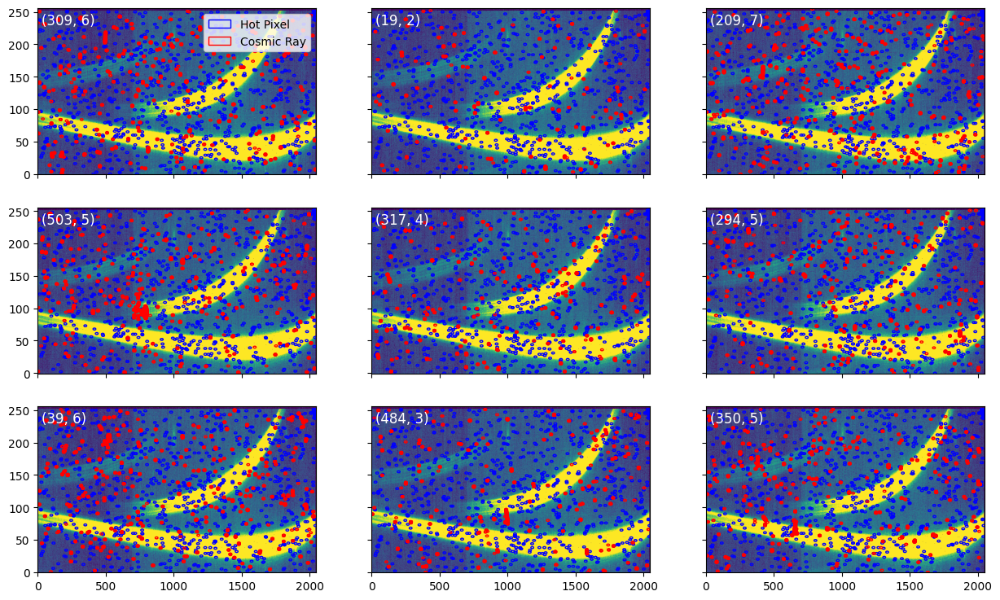

In [32]:
Image(filename=outdir_s1 + 'jump.png')

In [33]:
step = stage1.RampFitStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)

2025-08-20 11:58:43,283 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 11:58:44,591 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 11:58:44,763 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg001_nis_jump.fits>,).
2025-08-20 11:58:44,766 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 11:58:44,904 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 11:5

2025-08-20 11:59:32.548 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:00:55,408 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:00:55,430 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:00:55,627 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg002_nis_jump.fits>,).
2025-08-20 12:00:55,631 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:00:55,686 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:0

2025-08-20 12:01:53.093 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:03:15,556 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:03:15,578 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:03:15,777 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(158, 9, 256, 2048) from jw01366001001_04101_00001-seg003_nis_jump.fits>,).
2025-08-20 12:03:15,780 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:03:15,835 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:0

2025-08-20 12:04:13.966 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.


2025-08-20 12:05:36,591 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:05:36,613 - stpipe.RampFitStep - INFO - RampFitStep instance created.
2025-08-20 12:05:36,812 - stpipe.RampFitStep - INFO - Step RampFitStep running with args (<RampModel(63, 9, 256, 2048) from jw01366001001_04101_00001-seg004_nis_jump.fits>,).
2025-08-20 12:05:36,815 - stpipe.RampFitStep - INFO - Step RampFitStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
  int_name: ''
  save_opt: False
  opt_name: ''
  suppress_one_group: True
  maximum_cores: quarter
2025-08-20 12:05:36,870 - stpipe.RampFitStep - INFO - Using READNOISE reference file: ./crds_cache/references/jwst/niriss/jwst_niriss_readnoise_0005.fits
2025-08-20 12:05

2025-08-20 12:05:57.213 - exoTEDRF - INFO - Doing cosmetic NaN interpolation.
2025-08-20 12:06:30.300 - exoTEDRF - INFO - Step RampFitStep really done.


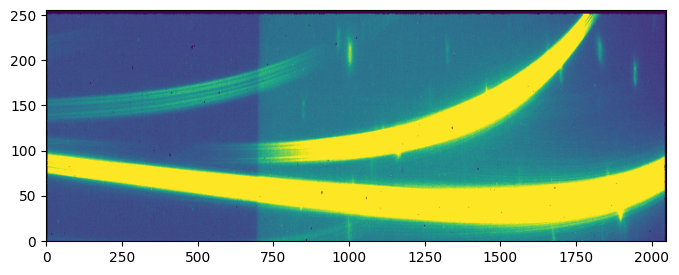

In [34]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_rampfitstep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()

In [35]:
step = stage1.GainScaleStep(results, output_dir=outdir_s1)

results = step.run(save_results=True, force_redo=True)



2025-08-20 12:06:31,443 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-20 12:06:31,463 - stpipe.GainScaleStep - INFO - GainScaleStep instance created.
2025-08-20 12:06:31,651 - stpipe.GainScaleStep - INFO - Step GainScaleStep running with args (<CubeModel(158, 256, 2048) from jw01366001001_04101_00001-seg001_nis_rampfitstep.fits>,).
2025-08-20 12:06:31,654 - stpipe.GainScaleStep - INFO - Step GainScaleStep parameters are:
  pre_hooks: []
  post_hooks: []
  output_file: None
  output_dir: /data/typhon2/hattie/jwst/wasp_39/pipeline_outputs_directory/Stage1/
  output_ext: .fits
  output_use_model: False
  output_use_index: True
  save_results: True
  skip: False
  suffix: None
  search_output_file: True
  input_dir: ''
2025-08-20 12:06:31,735 - stpipe.GainScaleStep - INFO - GAINFACT not found in gain reference file
2025-08-20 12:06:31,736 - stpipe.GainScaleStep - INFO - Step will be skipped
2025-08-20 12:06:31,747 - stpipe.GainScaleStep - INFO - Results used CRDS 

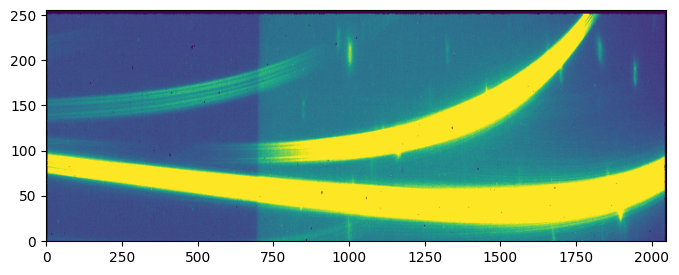

In [36]:
with fits.open(os.path.join(outdir_s1, f"{observation_id}_04101_00001-seg003_nis_gainscalestep.fits")) as file:
    plt.figure(figsize=(8, 3))
    plt.imshow(file[1].data[0], aspect='auto', origin='lower', vmin=1, vmax=16)
    plt.show()